In [16]:
import sys  
!{sys.executable} -m pip install --user matplotlib

  Using cached matplotlib-3.2.1-cp37-cp37m-macosx_10_9_x86_64.whl (12.4 MB)
  Using cached kiwisolver-1.2.0-cp37-cp37m-macosx_10_9_x86_64.whl (60 kB)
  Using cached cycler-0.10.0-py2.py3-none-any.whl (6.5 kB)
  Using cached pyparsing-2.4.7-py2.py3-none-any.whl (67 kB)


In [3]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [4]:
files = glob.glob('search+youtube/*.csv')

/Users/miriamblumenthal/opt/anaconda3/envs/covidProject/lib/python3.7/site-packages/ipykernel_launcher.py:85: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/miriamblumenthal/opt/anaconda3/envs/covidProject/lib/python3.7/site-packages/ipykernel_launcher.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/miriamblumenthal/opt/anaconda3/envs/covidProject/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) ar

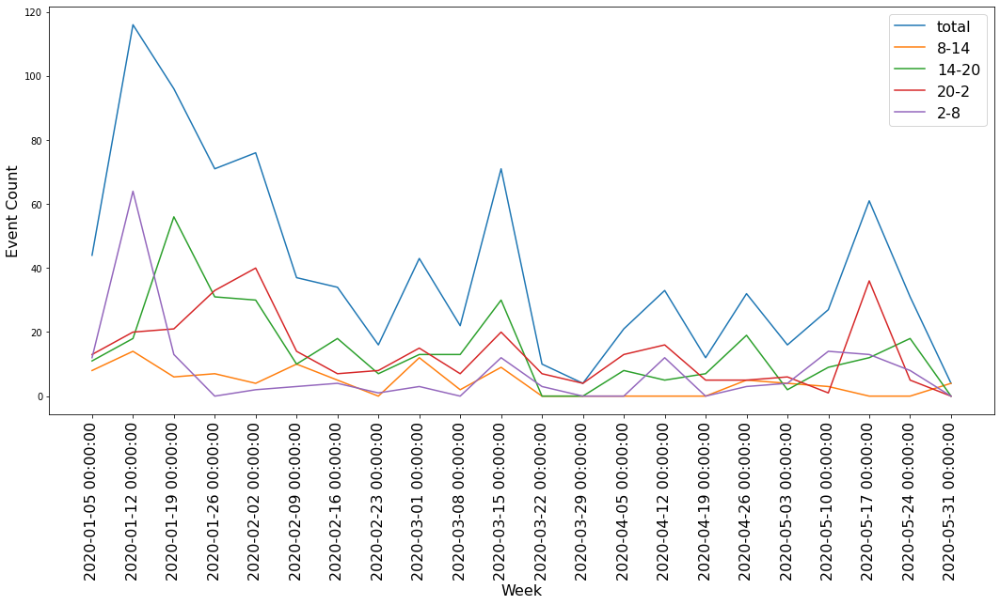

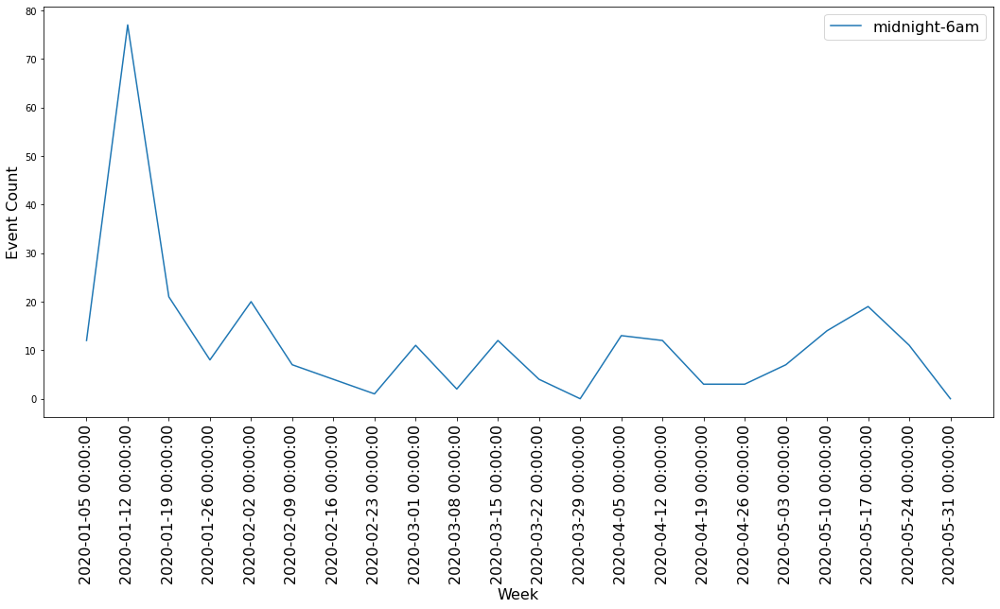

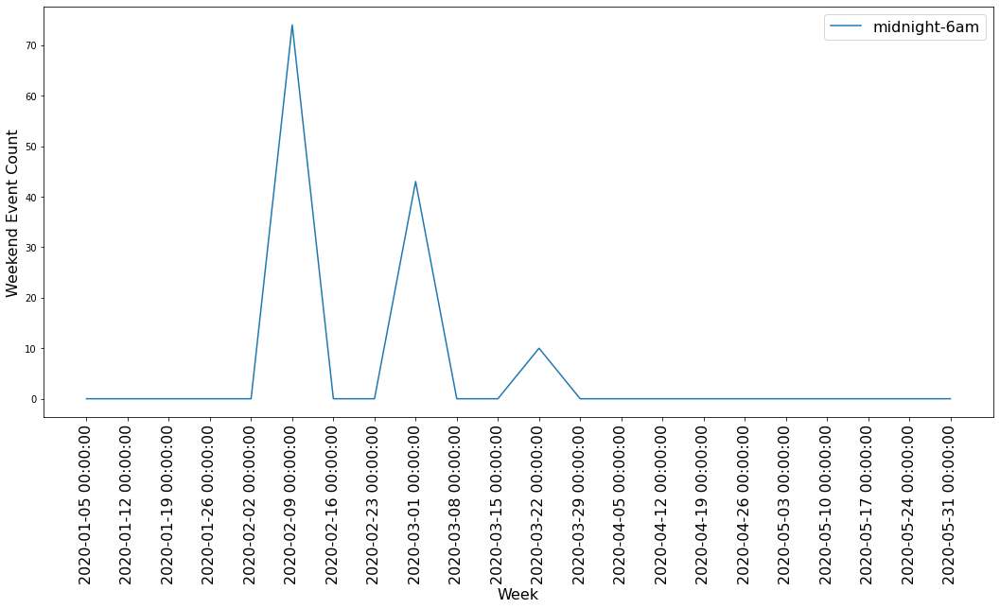

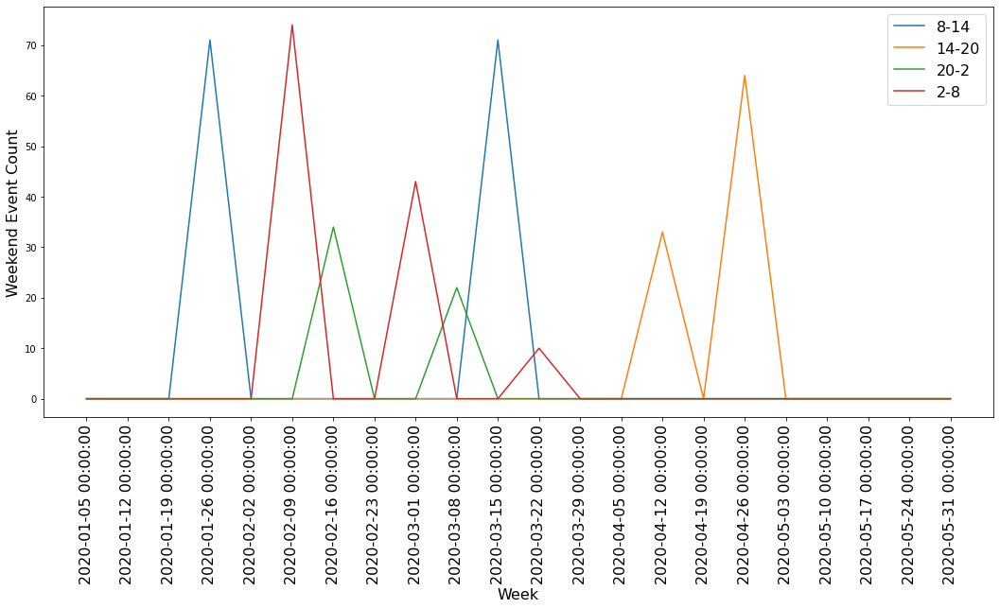

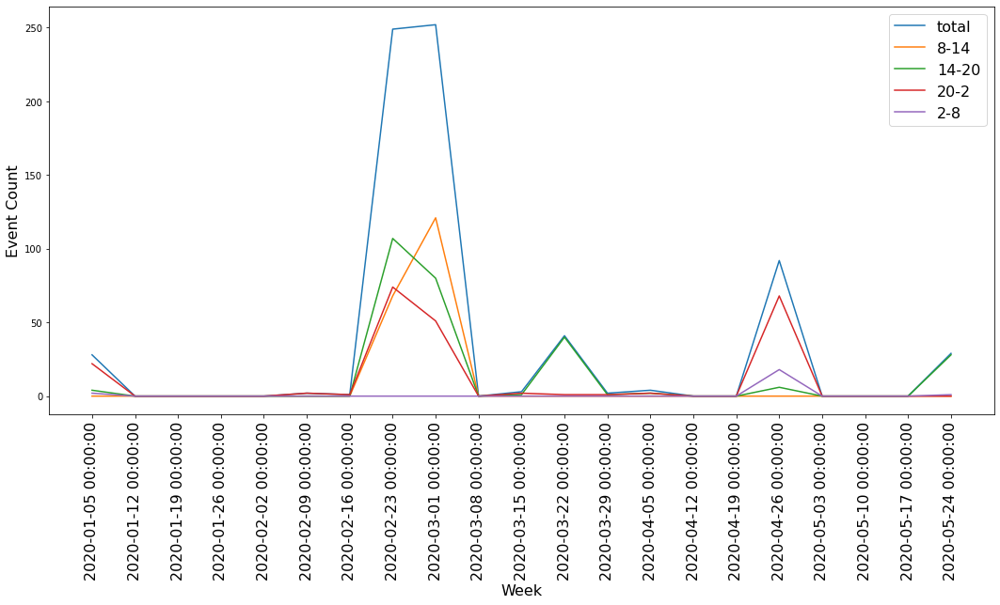

...

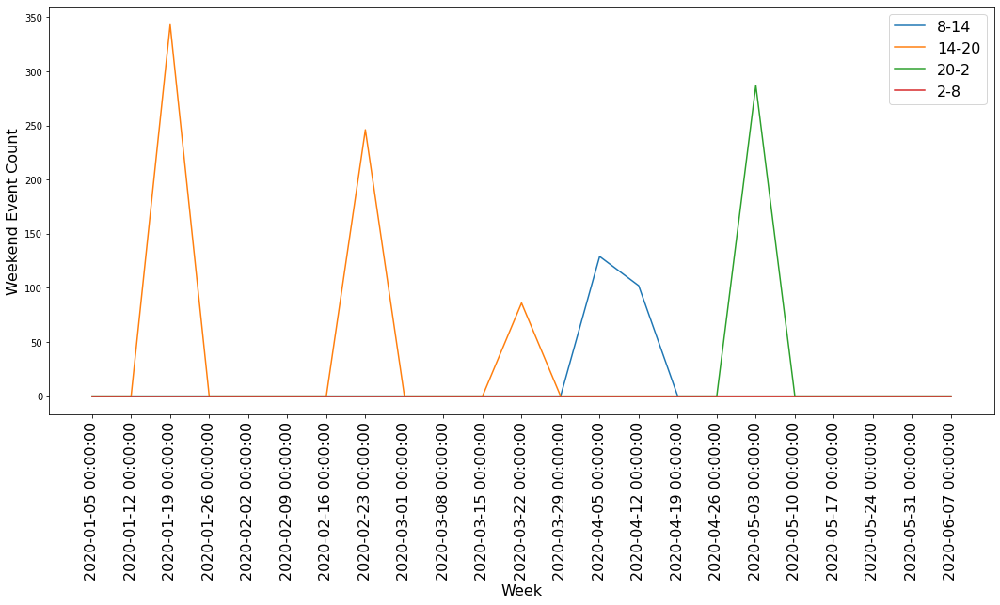

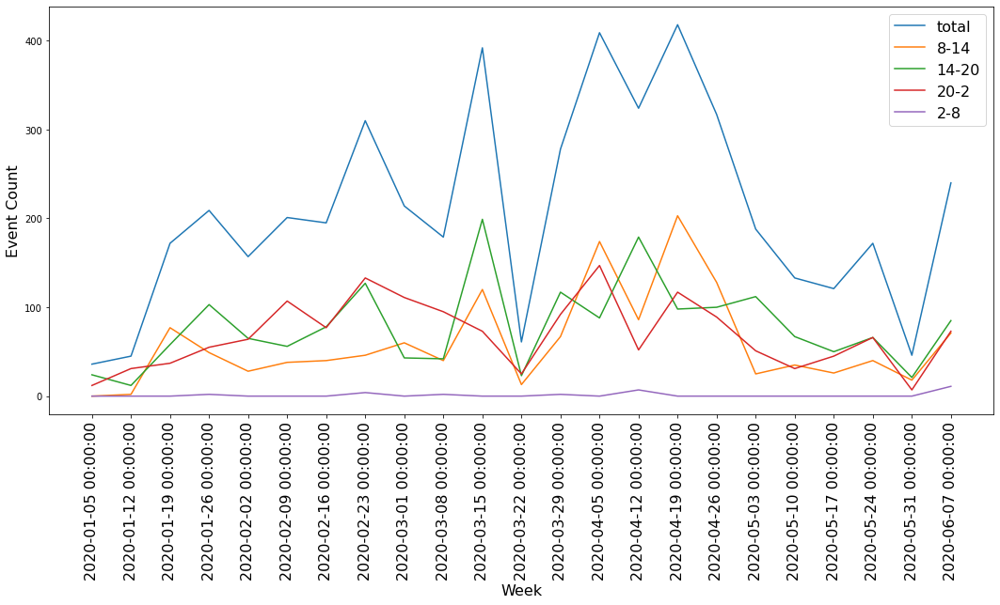

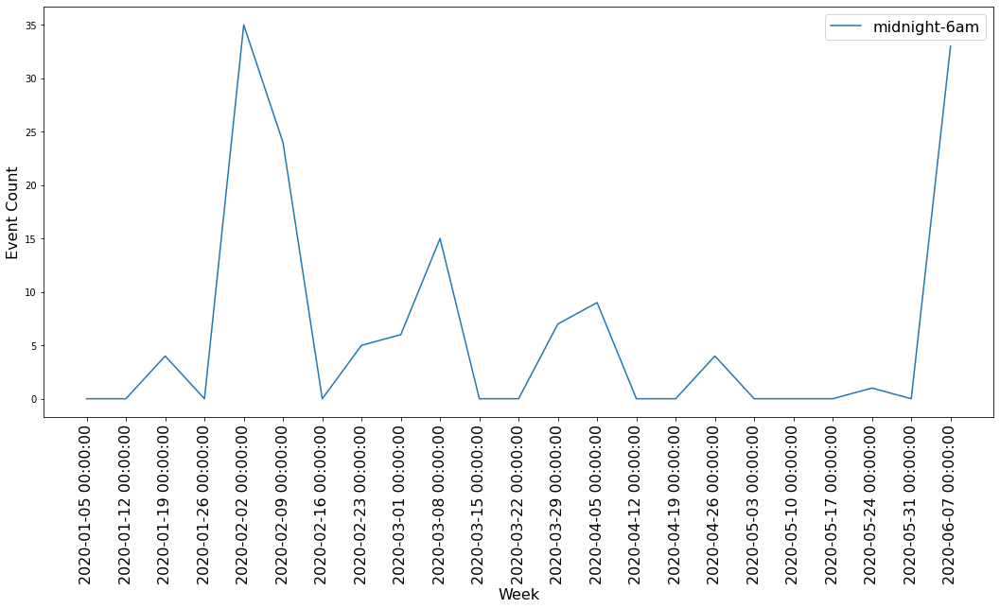

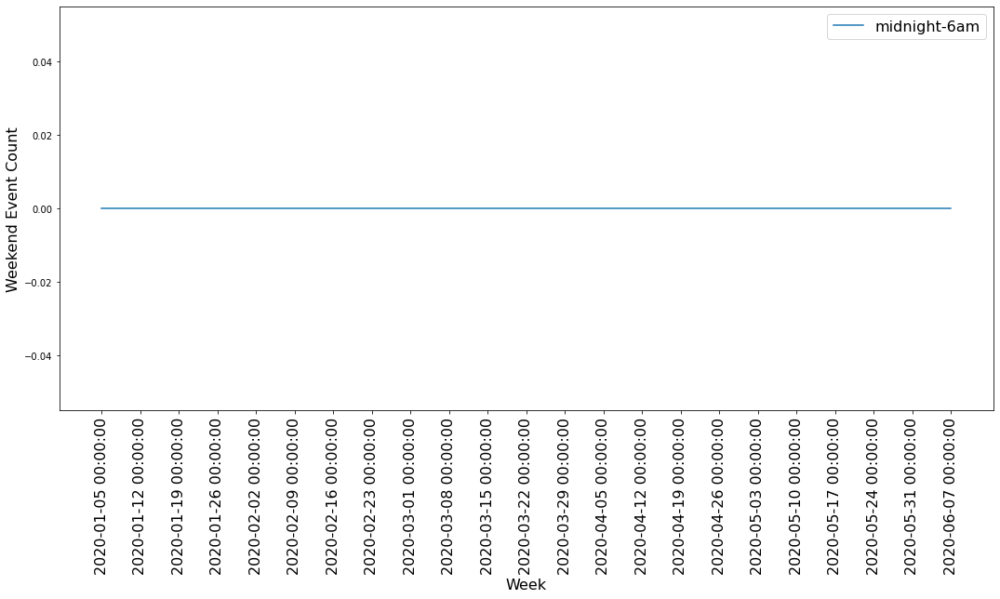

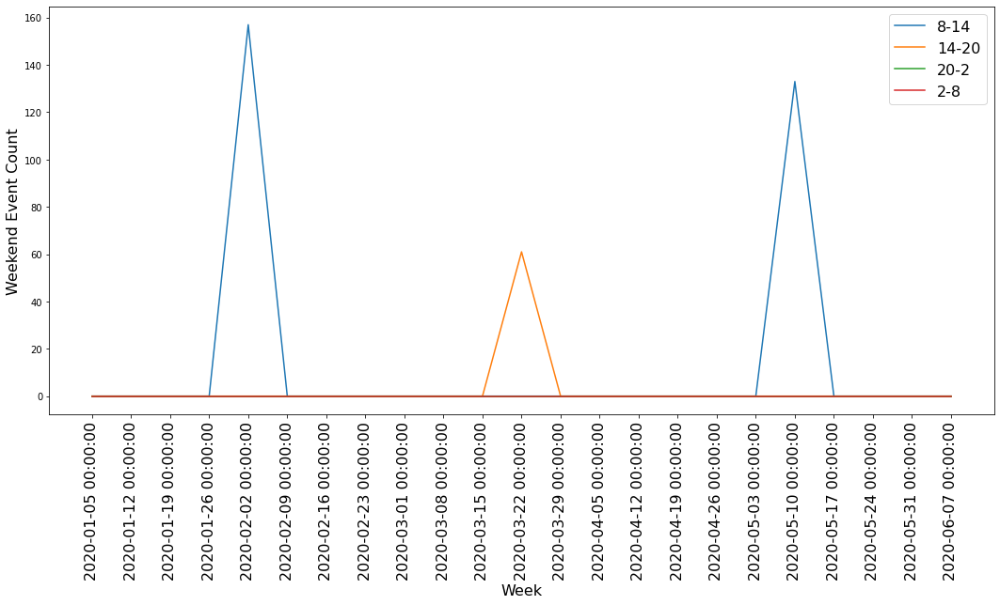

In [118]:
df_2020 = df_jan = df_feb = df_march = df_april = df_may = df_june = df_2019 = df_jan_march = pd.DataFrame(columns=pd.read_csv(files[0]).columns)
for f in files:
    df = pd.read_csv(f)
    df_jan = df_jan.append(df[(df.years == 2020) & (df.months == 1)], ignore_index=True)
    df_feb = df_feb.append(df[(df.years == 2020) & (df.months == 2)], ignore_index=True)
    df_march = df_march.append(df[(df.years == 2020) & (df.months == 3)], ignore_index=True)
    df_april = df_april.append(df[(df.years == 2020) & (df.months == 4)], ignore_index=True)
    df_may = df_may.append(df[(df.years == 2020) & (df.months == 5)], ignore_index=True)
    df_june = df_june.append(df[(df.years == 2020) & (df.months == 6)], ignore_index=True)
    df_2020 = df_june.append(df[(df.years == 2020) & (df.months < 6)], ignore_index=True)
    weekly_event_8_14_count = []
    weekly_event_14_20_count = []
    weekly_event_20_2_count = []
    weekly_event_2_8_count = []
    weekly_event_sleep_time_count = []
    weekend_event_8_14_count = []
    weekend_event_14_20_count = []
    weekend_event_20_2_count = []
    weekend_event_2_8_count = []
    weekend_event_sleep_time_count = []


    df_2020['datetime']= pd.to_datetime(df_2020['datetime'])
    weekly_event_count = []
    weekly_label = [] 

    for week, event in df_2020.set_index('datetime').groupby(pd.Grouper(freq='W')):
        num_total_weekly_events = sum(event.hours.value_counts().tolist())
        weekly_label.append(week)
    #     print(week, num_total_weekly_events)
        weekly_event_count.append(num_total_weekly_events)
        hr_activity = dict(event.hours.value_counts())
        day_activity = dict(event.weekdays.value_counts())
    #     print(hr_activity)
        total_8_14 = 0
        total_14_20 = 0
        total_20_2 = 0
        total_2_8 = 0
        total_sleep_hr_cnt = 0
        weekend_8_14 = 0
        weekend_14_20 = 0
        weekend_20_2 = 0
        weekend_2_8 = 0
        weekend_sleep_hr_cnt = 0
        for hr, v in hr_activity.items():
            if hr >= 8 and hr < 14:
                total_8_14 += v
            elif hr >= 14 and hr < 20:
                total_14_20 += v
            elif hr >= 20 or hr < 2:
                total_20_2 += v
            elif hr >= 2 and hr < 8:
                total_2_8 += v

            if hr >= 0 and hr <= 6:
                total_sleep_hr_cnt +=v

        for day, d in day_activity.items():
            for hour, v in hr_activity.items():
                if d == 5 or d == 6:
                    if hr >= 8 and hr < 14:
                        weekend_8_14 += v
                    elif hr >= 14 and hr < 20:
                        weekend_14_20 += v
                    elif hr >= 20 or hr < 2:
                        weekend_20_2 += v
                    elif hr >= 2 and hr < 8:
                        weekend_2_8 += v
                    if hr >= 0 and hr <= 6:
                        weekend_sleep_hr_cnt +=v

        weekly_event_8_14_count.append(total_8_14)
        weekly_event_14_20_count.append(total_14_20)
        weekly_event_20_2_count.append(total_20_2)
        weekly_event_2_8_count.append(total_2_8)
        weekly_event_sleep_time_count.append(total_sleep_hr_cnt)

        weekend_event_8_14_count.append(weekend_8_14)
        weekend_event_14_20_count.append(weekend_14_20)
        weekend_event_20_2_count.append(weekend_20_2)
        weekend_event_2_8_count.append(weekend_2_8)
        weekend_event_sleep_time_count.append(weekend_sleep_hr_cnt)


    plt.figure(figsize=(18, 8))
    plt.plot(range(len(weekly_event_count)), weekly_event_count, label = "total")
    plt.plot(range(len(weekly_event_8_14_count)), weekly_event_8_14_count, label = "8-14")
    plt.plot(range(len(weekly_event_14_20_count)), weekly_event_14_20_count, label = "14-20")
    plt.plot(range(len(weekly_event_20_2_count)), weekly_event_20_2_count, label = "20-2")
    plt.plot(range(len(weekly_event_2_8_count)), weekly_event_2_8_count, label = "2-8")

    plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
    plt.xlabel("Week", fontsize = 16)
    plt.ylabel("Event Count", fontsize = 16)
    plt.legend(fontsize = 16)


    plt.figure(figsize=(18, 8))
    plt.plot(range(len(weekly_event_sleep_time_count)), weekly_event_sleep_time_count, label = "midnight-6am")
    plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
    plt.xlabel("Week", fontsize = 16)
    plt.ylabel("Event Count", fontsize = 16)
    plt.legend(fontsize = 16)

    plt.figure(figsize=(18,8))
    plt.plot(range(len(weekend_event_sleep_time_count)), weekend_event_sleep_time_count, label = "midnight-6am")
    plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
    plt.xlabel("Week", fontsize = 16)
    plt.ylabel("Weekend Event Count", fontsize = 16)
    plt.legend(fontsize = 16)

    plt.figure(figsize=(18, 8))
    plt.plot(range(len(weekend_event_8_14_count)), weekend_event_8_14_count, label = "8-14")
    plt.plot(range(len(weekend_event_14_20_count)), weekend_event_14_20_count, label = "14-20")
    plt.plot(range(len(weekend_event_20_2_count)), weekend_event_20_2_count, label = "20-2")
    plt.plot(range(len(weekend_event_2_8_count)), weekend_event_2_8_count, label = "2-8")
    plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
    plt.xlabel("Week", fontsize = 16)
    plt.ylabel("Weekend Event Count", fontsize = 16)
    plt.legend(fontsize = 16)

In [30]:
# df_2020.groupby(df_2020['months']).count()
df_2020

,Unnamed: 0,Unnamed: 0.1,ratings,action,categories,dislikes,likes,durations,view_cnts,years,months,days,hours,minutes,weekdays,link,titles,source,query,datetime
0,127,127,NaN,Visited,[['/Jobs & Education/Education/Colleges & Univ...,NaN,NaN,NaN,NaN,2020,6,1,1,1,0,NaN,NaN,search,2019-2020 AMCAS Verification Timeline | Studen...,2020-06-01 01:01:00
1,128,128,NaN,Searched,[],NaN,NaN,NaN,NaN,2020,6,1,1,1,0,NaN,NaN,search,how long does it take to get amcas verified,2020-06-01 01:01:00
2,126,126,NaN,Searched,[],NaN,NaN,NaN,NaN,2020,6,1,1,5,0,NaN,NaN,search,amcas verification 2020,2020-06-01 01:05:00
3,125,125,NaN,Visited,[],NaN,NaN,NaN,NaN,2020,6,1,1,5,0,NaN,NaN,search,2019-2020 Application verified | Student Docto...,2020-06-01 01:05:00
4,124,124,NaN,Searched,[],NaN,NaN,NaN,NaN,2020,6,1,1,5,0,NaN,NaN,search,amcas verification 2019,2020-06-01 01:05:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4812,347,4,NaN,Searched,[],NaN,NaN,NaN,NaN,2020,5,28,19,3,3,NaN,NaN,search,elizabeth may ny,2020-05-28 19:03:00
4813,346,3,NaN,Visited,"[['/News', 0.6100000143051147], ['/Arts & Ente...",NaN,NaN,NaN,NaN,2020,5,28,19,3,3,NaN,NaN,search,Wedding: Richard A. Duvall and Elizabeth M. Ma...,2020-05-28 19:03:00
4814,345,2,NaN,Visited,"[['/Reference', 0.5699999928474426]]",NaN,NaN,NaN,NaN,2020,5,28,19,3,3,NaN,NaN,search,Contributions to the tribute of Elizabeth May,2020-05-28 19:03:00
4815,343,0,NaN,Visited,"[['/Jobs & Education/Education', 0.99000000953...",NaN,NaN,NaN,NaN,2020,5,29,10,54,4,NaN,NaN,search,"Anki - powerful, intelligent flashcards",2020-05-29 10:54:00


In [31]:
# for each week:
#     for every event in that week:
#             if event is between 8am-2pm:
#                 event_weekly_count[current]++
#     event_weekly_count.append(0)
#     current = event_weekly_count[current+1]

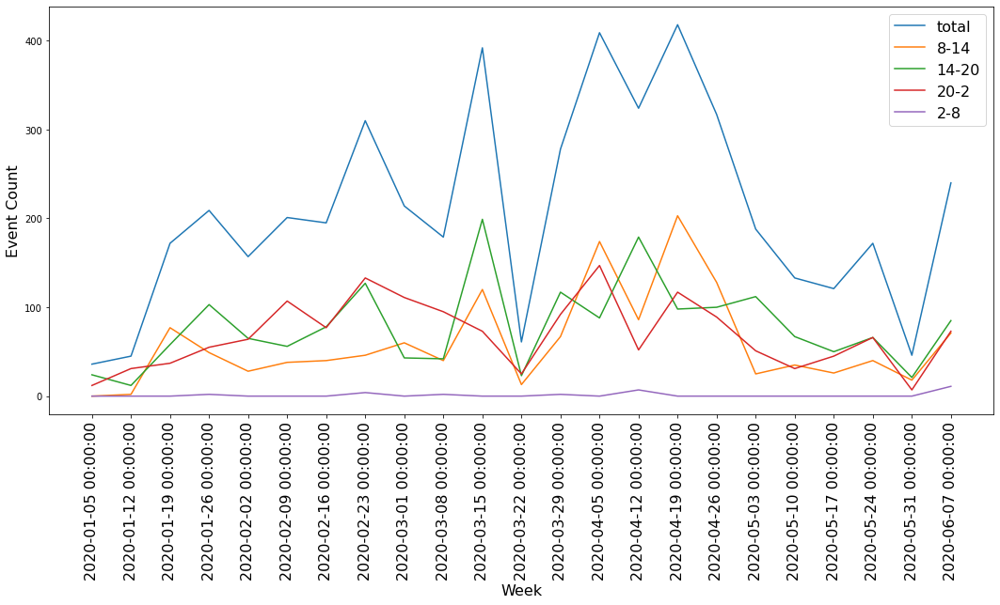

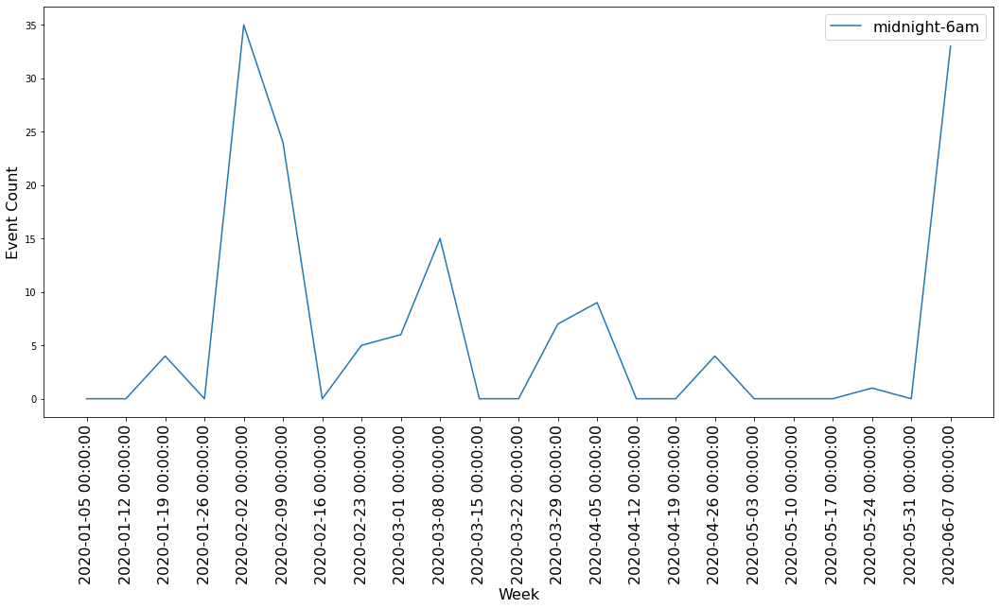

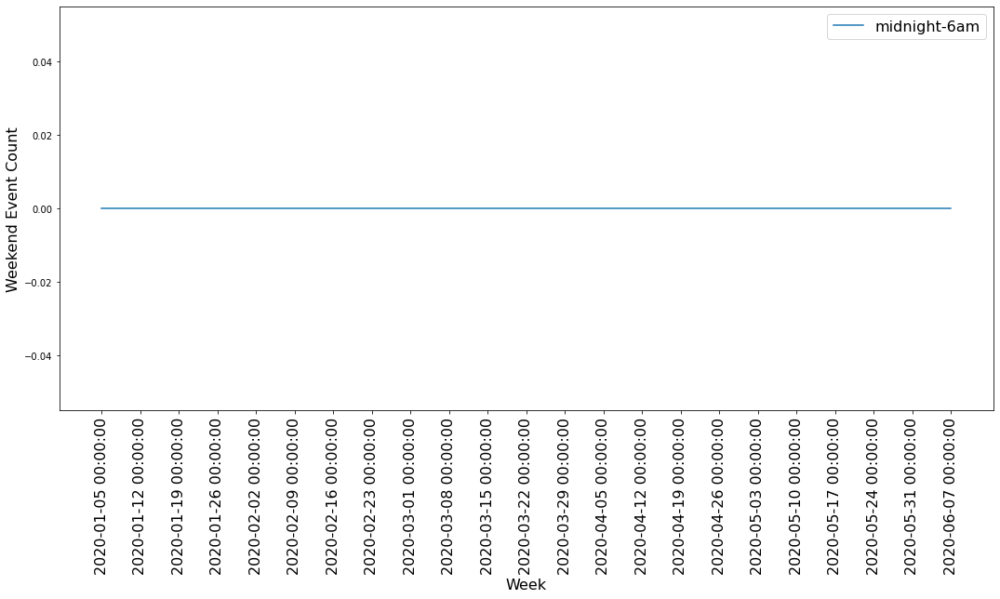

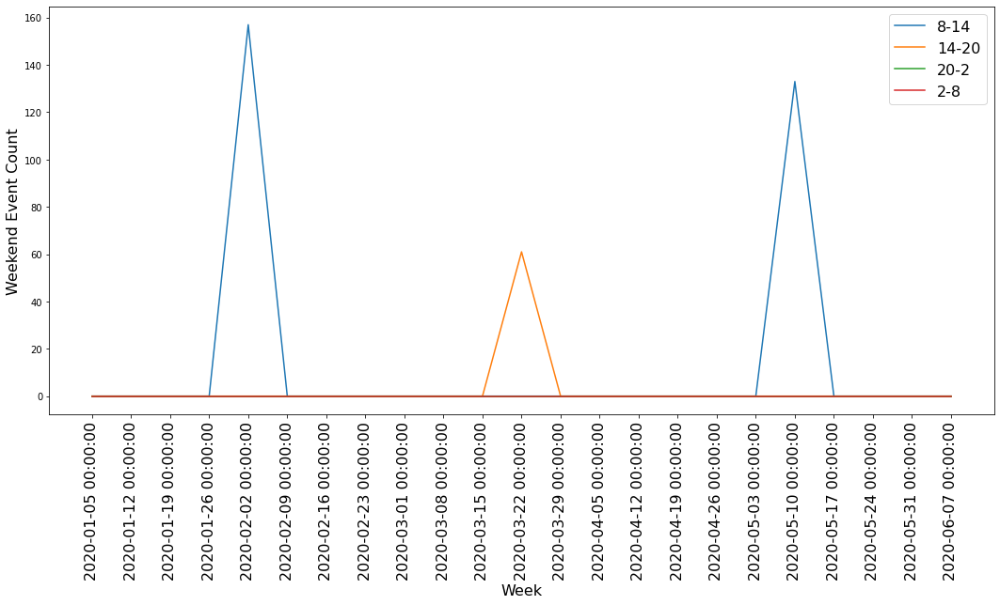

In [115]:
weekly_event_8_14_count = []
weekly_event_14_20_count = []
weekly_event_20_2_count = []
weekly_event_2_8_count = []
weekly_event_sleep_time_count = []
weekend_event_8_14_count = []
weekend_event_14_20_count = []
weekend_event_20_2_count = []
weekend_event_2_8_count = []
weekend_event_sleep_time_count = []


df_2020['datetime']= pd.to_datetime(df_2020['datetime'])
weekly_event_count = []
weekly_label = [] 

for week, event in df_2020.set_index('datetime').groupby(pd.Grouper(freq='W')):
    num_total_weekly_events = sum(event.hours.value_counts().tolist())
    weekly_label.append(week)
#     print(week, num_total_weekly_events)
    weekly_event_count.append(num_total_weekly_events)
    hr_activity = dict(event.hours.value_counts())
    day_activity = dict(event.weekdays.value_counts())
#     print(hr_activity)
    total_8_14 = 0
    total_14_20 = 0
    total_20_2 = 0
    total_2_8 = 0
    total_sleep_hr_cnt = 0
    weekend_8_14 = 0
    weekend_14_20 = 0
    weekend_20_2 = 0
    weekend_2_8 = 0
    weekend_sleep_hr_cnt = 0
    for hr, v in hr_activity.items():
        if hr >= 8 and hr < 14:
            total_8_14 += v
        elif hr >= 14 and hr < 20:
            total_14_20 += v
        elif hr >= 20 or hr < 2:
            total_20_2 += v
        elif hr >= 2 and hr < 8:
            total_2_8 += v
        
        if hr >= 0 and hr <= 6:
            total_sleep_hr_cnt +=v
            
    for day, d in day_activity.items():
        for hour, v in hr_activity.items():
            if d == 5 or d == 6:
                if hr >= 8 and hr < 14:
                    weekend_8_14 += v
                elif hr >= 14 and hr < 20:
                    weekend_14_20 += v
                elif hr >= 20 or hr < 2:
                    weekend_20_2 += v
                elif hr >= 2 and hr < 8:
                    weekend_2_8 += v
                if hr >= 0 and hr <= 6:
                    weekend_sleep_hr_cnt +=v
                
    weekly_event_8_14_count.append(total_8_14)
    weekly_event_14_20_count.append(total_14_20)
    weekly_event_20_2_count.append(total_20_2)
    weekly_event_2_8_count.append(total_2_8)
    weekly_event_sleep_time_count.append(total_sleep_hr_cnt)
    
    weekend_event_8_14_count.append(weekend_8_14)
    weekend_event_14_20_count.append(weekend_14_20)
    weekend_event_20_2_count.append(weekend_20_2)
    weekend_event_2_8_count.append(weekend_2_8)
    weekend_event_sleep_time_count.append(weekend_sleep_hr_cnt)


plt.figure(figsize=(18, 8))
plt.plot(range(len(weekly_event_count)), weekly_event_count, label = "total")
plt.plot(range(len(weekly_event_8_14_count)), weekly_event_8_14_count, label = "8-14")
plt.plot(range(len(weekly_event_14_20_count)), weekly_event_14_20_count, label = "14-20")
plt.plot(range(len(weekly_event_20_2_count)), weekly_event_20_2_count, label = "20-2")
plt.plot(range(len(weekly_event_2_8_count)), weekly_event_2_8_count, label = "2-8")

plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
plt.xlabel("Week", fontsize = 16)
plt.ylabel("Event Count", fontsize = 16)
plt.legend(fontsize = 16)


plt.figure(figsize=(18, 8))
plt.plot(range(len(weekly_event_sleep_time_count)), weekly_event_sleep_time_count, label = "midnight-6am")
plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
plt.xlabel("Week", fontsize = 16)
plt.ylabel("Event Count", fontsize = 16)
plt.legend(fontsize = 16)

plt.figure(figsize=(18,8))
plt.plot(range(len(weekend_event_sleep_time_count)), weekend_event_sleep_time_count, label = "midnight-6am")
plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
plt.xlabel("Week", fontsize = 16)
plt.ylabel("Weekend Event Count", fontsize = 16)
plt.legend(fontsize = 16)

plt.figure(figsize=(18, 8))
plt.plot(range(len(weekend_event_8_14_count)), weekend_event_8_14_count, label = "8-14")
plt.plot(range(len(weekend_event_14_20_count)), weekend_event_14_20_count, label = "14-20")
plt.plot(range(len(weekend_event_20_2_count)), weekend_event_20_2_count, label = "20-2")
plt.plot(range(len(weekend_event_2_8_count)), weekend_event_2_8_count, label = "2-8")
plt.xticks(range(len(weekly_label)), weekly_label, rotation = 90, fontsize = 16)
plt.xlabel("Week", fontsize = 16)
plt.ylabel("Weekend Event Count", fontsize = 16)
plt.legend(fontsize = 16)